In [1]:
import pandas as pd
import matplotlib.pylab as plt
import glob as glob
import os as os
import nibabel as nib
import numpy as np
from pandas.plotting import scatter_matrix
from nilearn.image import load_img
import matplotlib.cm as cm
import matplotlib as matplotlib

import matplotlib.animation as animation
import numpy as np
#from pylab import *

In [2]:
# set variables
%matplotlib inline

prediction_dir = 'prediction' #'prediction_nonorm_noempty' #'04_prediction_whole_img'
ext = '.png'
df = pd.read_csv(os.path.join(prediction_dir, 'brats_scores.csv'))
brain_at_depth = 72

In [3]:
dir_iterator = next(os.walk(prediction_dir))[1]
my_cmap_predict = cm.cool_r
my_cmap_predict.set_under('k', alpha=0)
my_cmap_true = cm.spring #cm.PiYG
my_cmap_true.set_under('k', alpha=0)
my_cmap_overlap = cm.brg
my_cmap_overlap.set_under('k', alpha=0)

font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

In [4]:
def plot_brain_with_mask(brain_img, mask_image, cmap_mask, unq = 1, brain_depth=72, 
                              mask_name='truth', plot_brain=True):
    '''
    '''
    if plot_brain:
        brain_img_at_depth = brain_img[:,:,brain_depth]
        plt.imshow(brain_img_at_depth, cmap='Greys')
    if unq != 0:
        mask_image[np.where(mask_image != unq)] = 0
        mask_image[np.where(mask_image == unq)] = 1
    else:
        mask_image[mask_image > 0] = 1
    one_mask_at_depth = mask_image[:,:,brain_depth]
    im = plt.imshow(one_mask_at_depth, cmap=cmap_mask, interpolation='none', clim=[0.9, 1.]) #, alpha = 0.5)
    mask_image_collapse = np.sum(mask_image,2)
    mask_image_collapse[mask_image_collapse > 0] = 1
    #print(np.shape(mask_image_collapse))
    im = plt.imshow(mask_image_collapse, cmap=cmap_mask, interpolation='none', clim=[0.9, 1.], alpha = 0.4)
    plt.title(mask_name + ', size:'+ str(np.count_nonzero(mask_image))+',here:'+str(np.count_nonzero(one_mask_at_depth)))
    #plt.title(str(unq)+ mask_name + ', size:'+ str(np.count_nonzero(mask_image))+',here:'+str(np.count_nonzero(one_mask_at_depth)))

working on validation case 287
saved at prediction/validation_case_287/truth_mask_depth_64.png


/home/parietal/mtelencz/miniconda3/envs/ramp_stroke_gpu/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


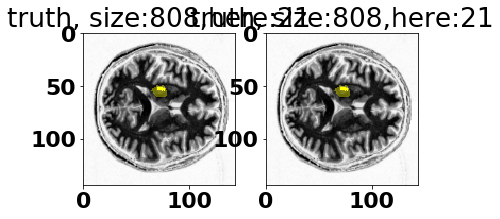

In [5]:
def plot_single_val_set(prediction_dir,val_dir, brain_depths=[64], ext='.png'):
    ''' 
    '''
    print('working on',val_dir.replace('_',' '))
    path_prediction = os.path.join(prediction_dir, val_dir)
    path_img_save = os.path.join(prediction_dir, val_dir)

    path_t1 = os.path.join(path_prediction, 'data_t1.nii.gz')
    path_true = os.path.join(path_prediction, 'truth.nii.gz')
    path_predict = os.path.join(path_prediction, 'prediction.nii.gz')

    # brain image
    validation_case = val_dir.split("_")[-1]
    brain_image = load_img(path_t1).get_data()
    mask_image = load_img(path_true).get_data()
        
    uniques = np.unique(mask_image)
    numb = len(uniques)
    
    for brain_depth in brain_depths:
        plt.figure()
        plt.rcParams["figure.figsize"] = (40,10)
        
        for idx,unq in enumerate(uniques):
            plt.subplot(1,numb,idx+1)
            plot_brain_with_mask(brain_img=brain_image, mask_image=mask_image.copy(), cmap_mask=my_cmap_true,
                                 unq=unq,
                                 brain_depth=brain_depth)
        img_path=os.path.join(path_prediction,'truth_mask_depth_'+str(brain_depth)+ext)
        print('saved at '+img_path)
        plt.savefig(img_path)
# save image

plot_single_val_set(prediction_dir=prediction_dir,val_dir=dir_iterator[0])

/home/parietal/mtelencz/miniconda3/envs/ramp_stroke_gpu/lib/python3.6/site-packages/ipykernel_launcher.py:54: FutureWarning: read_table is deprecated, use read_csv instead.


working on validation case 287
working on validation case 56
working on validation case 381
working on validation case 242
working on validation case 62
working on validation case 406
working on validation case 121
working on validation case 319
working on validation case 227
working on validation case 333
working on validation case 348
working on validation case 7
working on validation case 150
working on validation case 43
working on validation case 51
working on validation case 182
working on validation case 185
working on validation case 55
working on validation case 72
working on validation case 405


/home/parietal/mtelencz/miniconda3/envs/ramp_stroke_gpu/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


working on validation case 272
working on validation case 360
working on validation case 235
working on validation case 311
working on validation case 294
working on validation case 180
working on validation case 64
working on validation case 1
working on validation case 326
working on validation case 299
working on validation case 22
working on validation case 391
working on validation case 230
working on validation case 200
working on validation case 358
working on validation case 165
working on validation case 265
working on validation case 139
working on validation case 52
working on validation case 399
working on validation case 197
working on validation case 164
working on validation case 296
working on validation case 158
working on validation case 212
working on validation case 109
working on validation case 31
working on validation case 327
working on validation case 255
working on validation case 14
working on validation case 273
working on validation case 115
working on vali

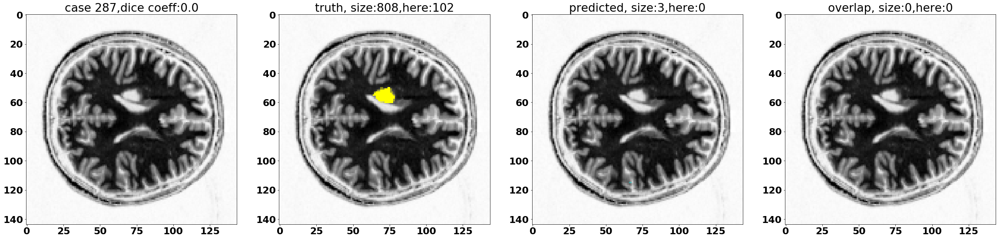

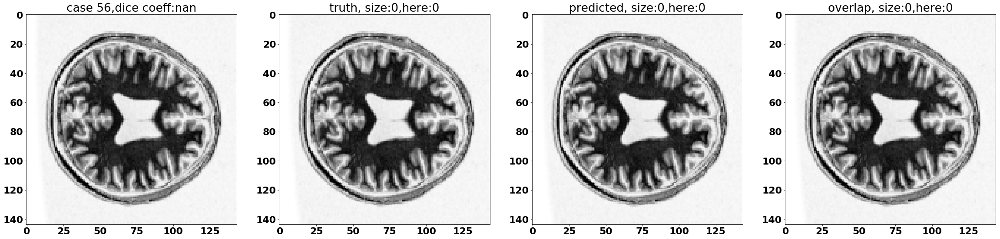

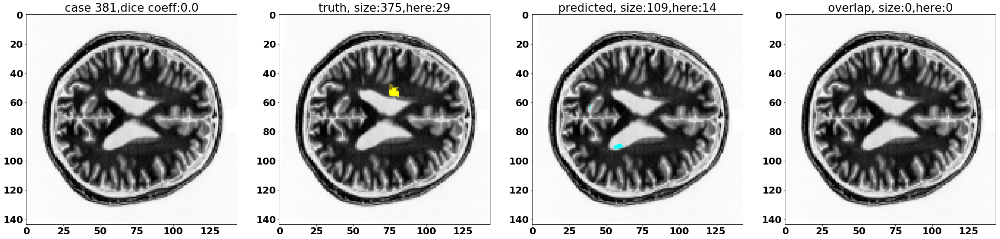

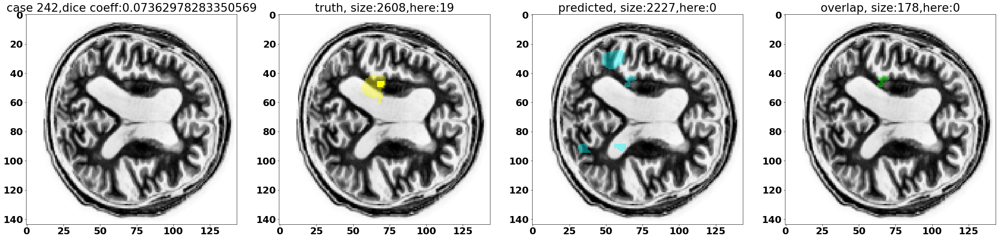

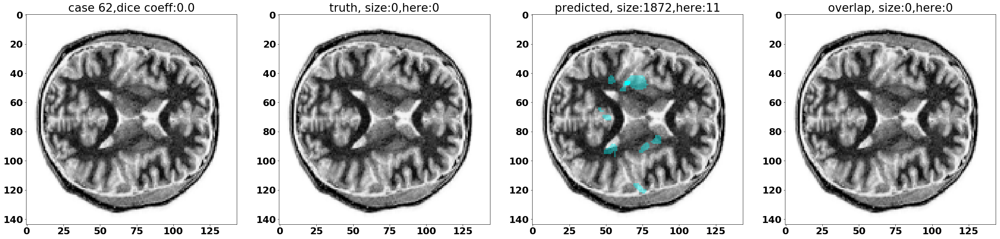

...

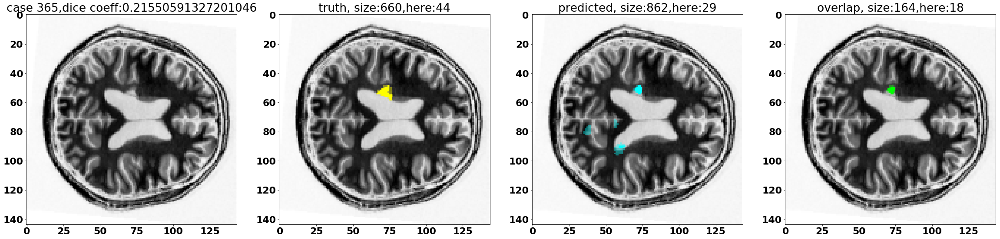

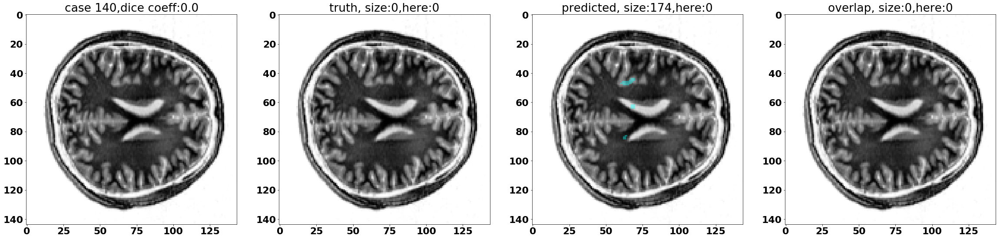

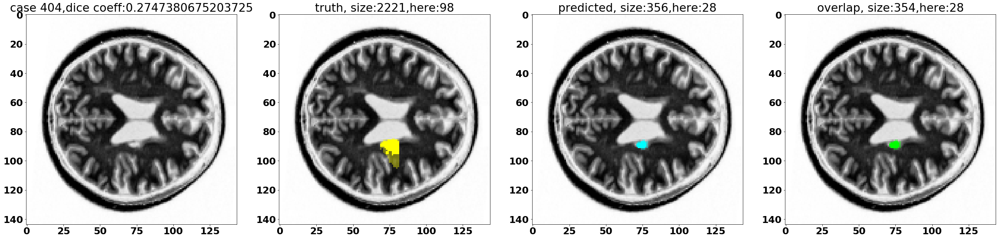

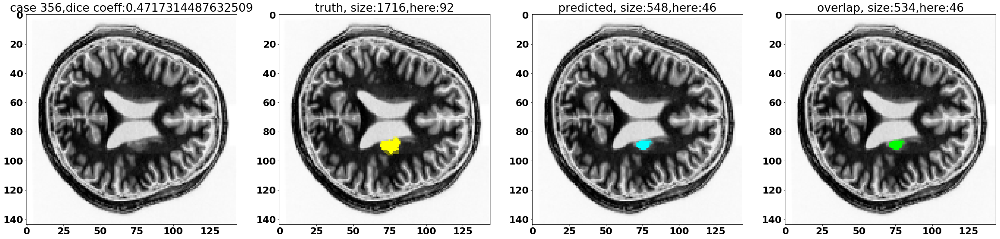

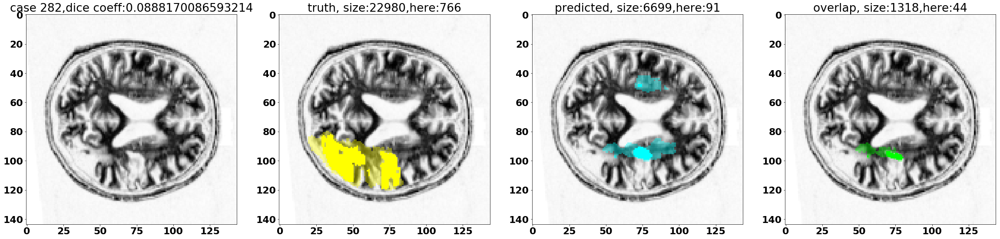

In [11]:
def plot_results(prediction_dir, val_dir):
    
    print('working on',val_dir.replace('_',' '))
    path_prediction = os.path.join(prediction_dir, val_dir)
    path_img_save = os.path.join(prediction_dir, val_dir)

    path_t1 = os.path.join(path_prediction, 'data_t1.nii.gz')
    path_true = os.path.join(path_prediction, 'truth.nii.gz')
    path_predict = os.path.join(path_prediction, 'prediction.nii.gz')
    
    # brain image
    df = pd.read_table(os.path.join(prediction_dir, 'brats_scores.csv'), sep=",")
    dice_coeff = df.loc[df['Unnamed: 0'] == val_dir]['DiceCoeff']
    
    validation_case = val_dir.split("_")[-1]
    brain_image = load_img(path_t1).get_data()
    mask_image = load_img(path_true).get_data()
    pred_image = load_img(path_predict).get_data()
    
    # plot brain image
    plt.subplot(1, 4, 1)
    brain_img_at_depth = brain_image[:,:,brain_at_depth]
    plt.imshow(brain_img_at_depth, cmap='Greys')
    plt.title('case ' + str(validation_case)+',dice coeff:'+str(dice_coeff.iloc[0]))
    
    # plot true mask
    plt.subplot(1,4,2)
    plot_brain_with_mask(brain_img=brain_image, mask_image=mask_image, 
                         cmap_mask=my_cmap_true,
                         unq = 0, brain_depth=brain_at_depth,
                         mask_name='truth')
    
    # plot predicted mask
    plt.subplot(1,4,3)
    plot_brain_with_mask(brain_img=brain_image, mask_image=pred_image, 
                         cmap_mask=my_cmap_predict,
                         unq = 0, brain_depth=brain_at_depth,
                         mask_name='predicted')

    # plot overlap mask
    plt.subplot(1,4,4)
    mask_image[mask_image>0] = 1
    pred_image[pred_image>0] = 1
    overlap_image = mask_image + pred_image
    overlap_image = overlap_image - 1
    overlap_image[overlap_image < 1] = 0
    
    plot_brain_with_mask(brain_img=brain_image, mask_image=overlap_image, 
                         cmap_mask=my_cmap_overlap, #my_cmap_overlap,
                         unq = 0, brain_depth=brain_at_depth,
                         mask_name='overlap', plot_brain = True)
    

df = pd.read_table(os.path.join(prediction_dir, 'brats_scores.csv'), sep=",")

for next_dir in dir_iterator:
#for i in range(5,20):   
    plt.figure()
    #next_dir = dir_iterator[i]
    plot_results(prediction_dir=prediction_dir, val_dir=next_dir)
    img_path = os.path.join(prediction_dir, next_dir)
    plt.savefig(os.path.join(img_path,'prediction'+ext))
    #plt.close('all')
    

In [7]:
%ls
print(prediction_dir)

brats_data.h5    prediction/                 training_ids.pkl
data/            prediction_doc/             training.log
evaluate.py      prediction_nonorm_noempty/  train_isensee2017.py
imgs/            predict.py                  train.py
__init__.py      preprocess.py               tumor_segmentation_model.h5
logs.ipython     __pycache__/                validation_ids.pkl
loss_graph.png   set_training_idcs.py        validation_scores_boxplot.png
plot_results.py  temp_algorithms.ipynb
prediction


Index(['Unnamed: 0', 't1_path', 'truth_path', 'idx_ref', 'is_train'], dtype='object')


/home/parietal/mtelencz/miniconda3/envs/ramp_stroke_gpu/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: read_table is deprecated, use read_csv instead.
  This is separate from the ipykernel package so we can avoid doing imports until


(197, 233, 189)
brats_data.h5    prediction/                 training_ids.pkl
data/            prediction_doc/             training.log
evaluate.py      prediction_nonorm_noempty/  train_isensee2017.py
imgs/            predict.py                  train.py
__init__.py      preprocess.py               tumor_segmentation_model.h5
logs.ipython     __pycache__/                validation_ids.pkl
loss_graph.png   set_training_idcs.py        validation_scores_boxplot.png
plot_results.py  temp_algorithms.ipynb
(197, 233)
saved data/example0.png
(197, 233)
saved data/example1.png


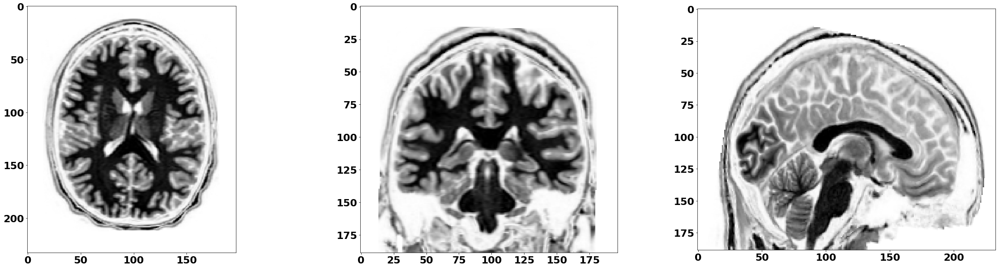

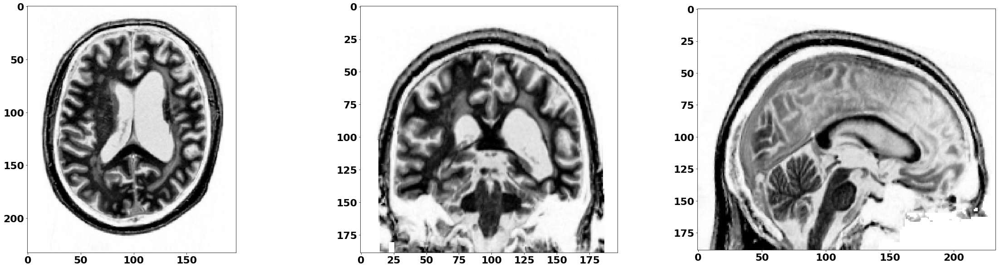

In [8]:
from scipy import ndimage
#variables used in text
brats_score = pd.read_table(os.path.join(prediction_dir, 'brats_scores.csv'), sep=",")

file_index = pd.read_table(os.path.join('data', 'File_index.csv'), sep=",")

print(file_index.keys())
healthy = file_index[file_index['t1_path'].str.contains("healthy")]
stroke = file_index[~file_index["t1_path"].str.contains("healthy")]

healthy_valid = healthy[healthy['is_train'] == False]
stroke_valid = stroke[stroke['is_train'] == False]

no_healthy = len(healthy)
no_stroke = len(stroke)
no_mri_scans = no_healthy + no_stroke
no_healthy_valid = len(healthy_valid)
no_stroke_valid = len(stroke_valid)

original_data_dir_healthy = '../../data/healthy/sub_01903_t1_final.nii.gz'
original_data_dir_stroke = '../../data/ATLAS_R1.1/Site6/031930/t01/031930_t1w_deface_stx.nii.gz'
health_img = load_img(original_data_dir_healthy).get_data()
stroke_img = load_img(original_data_dir_stroke).get_data()

shape_img = np.shape(health_img)
print(shape_img)

%ls
for idx, next_img in enumerate([health_img, stroke_img]):
    print(np.shape(next_img[:,:,90]))
    plt.figure()
    
    plt.subplot(1,3,1)
    plt.imshow(ndimage.rotate(next_img[:,:,90], 90), cmap='Greys')
    
    plt.subplot(1,3,2)
    plt.imshow(ndimage.rotate(next_img[:,100,:], 90), cmap='Greys')
    
    plt.subplot(1,3,3)
    plt.imshow(ndimage.rotate(next_img[100,:,:], 90), cmap='Greys')
    
    plt.savefig('data/example'+ str(idx)+ ext)
    print('saved data/example'+ str(idx)+ ext)



#validation_case = val_dir.split("_")[-1]
#brain_image = load_img(path_t1).get_data()
#mask_image = load_img(path_true).get_data()
#pred_image = load_img(path_predict).get_data()
#glob.glob(os.path.join(stroke_folder, "*"))
#data_dir = 'preprocessed/'
#data_healthy_dir = 
#data_stroke_dir = 
#no_healthy_scans = 
#no_stroke_scans = 
#no_mri_scans
#%cd

In [23]:

# make .tex code to put all the predicted images and the score etc into a pdf
print('\\documentclass[12pt,a4paper]{article}')
print('\\usepackage{graphicx}')
print('\\usepackage{hyperref}')
print('\\begin{document}')


# beginning of the document and title
print('\\title{Progress on the segmentation of stroke data (RAMP)}')
print('\\author{Maria Tele\\\'{n}czuk (CDS, Inria), Lucy Liu (CDS, Inria),')
print('\\\\ Sook-Lei Liew (USC), Ga\\\"{e}l Varoquaux (Inria, Parietal),')
print('\\\\ Alexandre Gramfort (Inria, Parietal),')
print('\\\\Guillaume Lemaitre (Scikit-learn, Inria Foundation)}')
print('\\date{\\today}')
print('\\maketitle')

label_brain_scans = 'fig:ex_brains' 
# problem example
print('\\begin{abstract}')
print('\\section{Problem}')
print('Stroke is the leading cause of adult disability worldwide, with up to two-thirds of individuals ')
print('experiencing long-term disabilities. Large-scale neuroimaging studies have shown promise in ')
print('identifying robust biomarkers (e.g., measures of brain structure) of stroke recovery.')
print(' However, analyzing large datasets is problematic due to barriers in accurate stroke lesion ')
print('segmentation. Manually-traced lesions are currently the gold standard for lesion segmentation,')
print(' but are labor intensive and require anatomical expertise. While algorithms have been developed')
print('to automate this process, the results often lack accuracy. Newer algorithms that employ ')
print('machine-learning techniques are promising, yet these require large training datasets to optimize ')
print('performance. More information: ')
print('\\begin{enumerate}')
print('\\item \\url{http://fcon_1000.projects.nitrc.org/indi/retro/atlas.html}')
print('\\item \\url{https://www.biorxiv.org/content/10.1101/179614v1}')
print('\\item \\url{https://www.sciencedirect.com/science/article/abs/pii/S1361841516301268}')
print('\\end{enumerate}')
      
print('\\section{Data explanation}')
print(f'Dataset includes {no_mri_scans} MRI scans: {no_stroke} recorded from the patients with lesion (a consequence of a stroke) while {no_healthy} are recorded from the healthy patients. Each image is of size {shape_img[0]} x {shape_img[1]} x {shape_img[2]}. Examples of the brain MRI scans are in the Fig.')
print('\\ref{' + label_brain_scans + '}.')
print('In some cases there were more than one mask (mask being a true lesion) given for single brain scan. In this cases we collapsed it to a single mask.')

print('\\begin{figure}')  
print('\\includegraphics[width=1.\\linewidth]{../data/example0'+ext+'}')  
print('\\includegraphics[width=1.\\linewidth]{../data/example1'+ext+'}') 
print('\\caption{Exemplar brain scans}')  
print('\\label{'+label_brain_scans+'}')
print('\\end{figure}')


print('\\section{Preprocessing}')  
print(f'Each scan was resampled to 144 x 144 x 144 pxls. The dataset was randomly split to 80\% of scans used for training and remaining 20\\% used for the validation. The validation set presented here includs {no_healthy_valid} healthy and {no_stroke_valid} scans with lesion.')

print('\\section{Algorithm used}')   
print(f'Note that the aim of using this algorithm was not to get the perfect result but to see if the algorithm might be able to localize the lesions with a chance higher than random.')
print('As an algorithm of choice we decided to use \href{https://arxiv.org/abs/1505.04597}{Unet} frequently used for biomedical image segmentation. ')
print('We adapted \href{https://github.com/ellisdg/3DUnetCNN}{Unet library of David Ellis}.')
print(f'During RAMP challenge this algorithm would be presented to the participants as a sample solution and can be either developed further or changed to a different algorithm')

print('\\section{Results}')
print(f'The whole validation set including \\\\(i) the original brain scan at the depth of {brain_at_depth}/144 pxls;')
print('\\\\(ii) true mask (yellow);')
print('\\\\(iii) predicted mask (blue);')
print('\\\\and (iv) overlap of the two (green) is added to the end of this document.')
print('Strong colors indicate the lesion at given depth while lighter colors indicate lesion at other depths.')
print('Dice coefficient is displayed in the title as well as the total and at given depth pixel size of each mask')

print('\\section{Challenges of this project}')  

print('\\section{Perspectives}')
print('If evaluated positivly the next steps should be:')
print('\\begin{enumerate}')
print('\\item simplify unet code, ie make a package to be used by participants')
print('\\item decide on the evaluation')
print('\\item apply for \href{https://aws.amazon.com/research-credits/}{AWS grant} (next deadline to apply: 31 December)')
print('\\item include Stroke challenge in the RAMP')
print('\\item organize the stroke challenge')
print('\\end{enumerate}')
print('\\end{abstract}')

# explanation of the solution

# solution results
print('\\includegraphics[width=1.\\linewidth]{../prediction/dice_validation'+ext+'}')
print('\\includegraphics[width=1.\\linewidth]{../prediction/dice_coef_hist'+ext+'}')
print('\\begin{center}')
# detailed results: picture + dice score etc
for next_dir in dir_iterator[:5]:
#for  in [5]:
    img_path = os.path.join('..',prediction_dir, next_dir, 'prediction'+ext)
    print('\\makebox[\\textwidth][c]{\\includegraphics[width=1.8\\linewidth]{'+img_path+'}}\%')
    #print('\\includegraphics[width=2.\\linewidth]{'+img_path+'}')
    #\includegraphics[width=5cm]{example-image-b}
print('\\end{center}')
# end of the document

print('\\end{document}')

\documentclass[12pt,a4paper]{article}
\usepackage{graphicx}
\usepackage{hyperref}
\begin{document}
\title{Progress on the segmentation of stroke data (RAMP)}
\author{Maria Tele\'{n}czuk (CDS, Inria), Lucy Liu (CDS, Inria),
\\ Sook-Lei Liew (USC), Ga\"{e}l Varoquaux (Inria, Parietal),
\\ Alexandre Gramfort (Inria, Parietal),
\\Guillaume Lemaitre (Scikit-learn, Inria Foundation)}
\date{\today}
\maketitle
\begin{abstract}
\section{Problem}
Stroke is the leading cause of adult disability worldwide, with up to two-thirds of individuals 
experiencing long-term disabilities. Large-scale neuroimaging studies have shown promise in 
identifying robust biomarkers (e.g., measures of brain structure) of stroke recovery.
 However, analyzing large datasets is problematic due to barriers in accurate stroke lesion 
segmentation. Manually-traced lesions are currently the gold standard for lesion segmentation,
 but are labor intensive and require anatomical expertise. While algorithms have been developed

In [10]:
df.head()

,Unnamed: 0,DiceCoeff,TruthSize,PredictSize
0,validation_case_287,0.00000,808,3
1,validation_case_56,NaN,0,0
2,validation_case_381,0.00000,375,109
3,validation_case_242,0.07363,2608,2227
4,validation_case_62,0.00000,0,1872
